In [1]:
import os, sys
from pathlib import Path

_here = Path(os.getcwd())
_root = _here if (_here / "sae").is_dir() else _here.parent
if str(_root) not in sys.path:
    sys.path.insert(0, str(_root))

import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from torchvision.datasets import ImageFolder
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [2]:
CHECKPOINT   = str(_root / "sae/checkpoints/sae_block10_k64_final.pt")
UNITOK_CKPT  = os.path.expandvars("$WRKDIR/UniTok/unitok_tokenizer.pth")
IMAGENET_VAL = os.path.expandvars("$WRKDIR/imagenet/val")
# OUTPUT_DIR   = str(_root / "sae/analysis/ablation")

# FEATURE_ID  = 42    
# N_IMAGES    = 4     
# SCAN_LIMIT  = 5000  
# STEER_SCALE = 10.0   

# os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"Project root : {_root}")
print(f"Checkpoint   : {CHECKPOINT}")
# print(f"Output dir   : {OUTPUT_DIR}")

Project root : /scratch/work/vuh12/UniTok
Checkpoint   : /scratch/work/vuh12/UniTok/sae/checkpoints/sae_block10_k64_final.pt


In [3]:
from sae.model import TopKSAE
from sae.unitok_loader import build_unitok

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

ckpt = torch.load(CHECKPOINT, map_location="cpu")
sae  = TopKSAE(ckpt["input_dim"], ckpt["hidden_dim"], ckpt["k"]).eval().to(device)
sae.load_state_dict(ckpt["sae"])
print(f"SAE  k={ckpt['k']}  hidden={ckpt['hidden_dim']}  input={ckpt['input_dim']}")

unitok = build_unitok(UNITOK_CKPT, device)
print("UniTok loaded")

Device: cuda


No pretrained configuration specified for vitamin_large model. Using a default. Please add a config to the model pretrained_cfg registry or pass explicitly.


SAE  k=64  hidden=8192  input=1024


No pretrained configuration specified for vitamin_large model. Using a default. Please add a config to the model pretrained_cfg registry or pass explicitly.


[unitok_loader] Loading checkpoint: /scratch/work/vuh12/UniTok/unitok_tokenizer.pth
[unitok_loader] Missing: 0, Unexpected: 0
UniTok loaded


In [4]:
def make_transform(img_size=256):
    return transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x * 2 - 1),
    ])

def denorm(x):
    return ((x + 1) / 2).clamp(0, 1)

def to_np(t):
    return (t.cpu().clamp(0, 1).permute(1, 2, 0).numpy() * 255).astype(np.uint8)

In [5]:
IMAGE_A_PATH = "/scratch/work/vuh12/UniTok/sae/castle.jpg"   
IMAGE_B_PATH = "/scratch/work/vuh12/UniTok/sae/castlewithsun.jpg"
transform = make_transform()

pil_a = Image.open(IMAGE_A_PATH).convert("RGB").resize((256, 256))
pil_b = Image.open(IMAGE_B_PATH).convert("RGB").resize((256, 256))
tensor_a = transform(pil_a).unsqueeze(0).to(device)
tensor_b = transform(pil_b).unsqueeze(0).to(device)

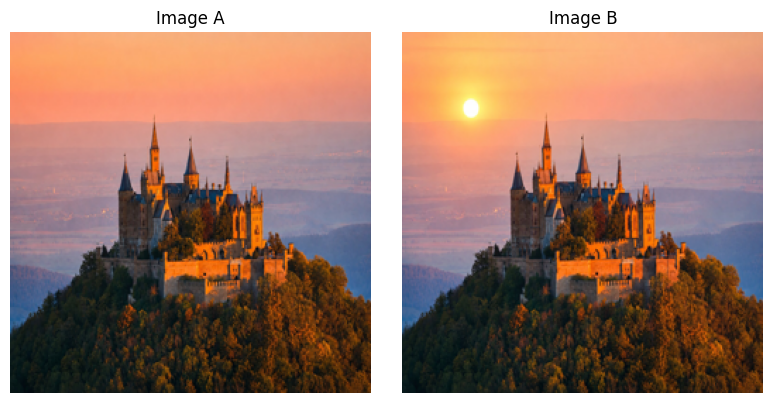

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("Image A"); axes[0].axis("off")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("Image B"); axes[1].axis("off")
plt.tight_layout(); plt.show()

In [7]:
@torch.no_grad()
def delta_forward(imgs, delta):
    def _hook(module, inp, out):
        B, L, D = out.shape
        latent, _, _, _ = sae.encode(out.float().reshape(B * L, D))
        latent = latent + delta.unsqueeze(0)
        return sae.decode(latent).reshape(B, L, D).to(out.dtype)
    handle = unitok.encoder.blocks[10].register_forward_hook(_hook)
    try:
        img_tokens = unitok.encoder(imgs).float()
        img_tokens = unitok.quant_proj(img_tokens)
        img_tokens, _, _, _ = unitok.quantizer(img_tokens)
        img_tokens = unitok.post_quant_proj(img_tokens)
        img_rec    = unitok.decoder(img_tokens).clamp(-1, 1)
    finally:
        handle.remove()
    return denorm(img_rec)

In [8]:
# run before the next cell
DENSE_PATH = str(_root / "sae/dense_features.pt")
dense_data = torch.load(DENSE_PATH, map_location="cpu")
dense_feature_ids = dense_data["dense_features"]
dense_mask = torch.zeros(sae.hidden_dim, dtype=torch.bool)
dense_mask[dense_feature_ids] = True
dense_mask = dense_mask.to(device)
print(len(dense_feature_ids))

120


# L0, global delta

In [7]:
def project_topk(delta, k):
    if (delta.abs() > 0).sum() <= k:
        return delta
    threshold = delta.abs().topk(k).values.min()
    return delta * (delta.abs() >= threshold).float()


def find_optimal_delta(
    tensor_a,
    tensor_b,
    k_sparse  = 10,
    n_steps   = 1000,
    step_size = 0.5,
    patience  = 50,
    min_delta = 1e-6,
    verbose   = True,
):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach() # (B, L, quant_dim)

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    try:
        with torch.no_grad():
            unitok.encoder(tensor_a)
            src_acts = act_buffer[0]
    finally:
        handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    k_check    = max(int(0.22 * n_steps), 1)
    size_decr  = max(int(0.03 * n_steps), 1)
    n_iter_min = max(int(0.06 * n_steps), 1)
    step_size_t    = torch.tensor(step_size, device=device)
    delta          = torch.zeros(sae.hidden_dim, device=device)
    delta_old      = delta.clone()
    delta_best     = delta.clone()
    loss_best      = torch.tensor(float('inf'), device=device)
    loss_steps     = []
    counter        = 0
    no_improve     = 0

    def _forward_with_delta(d):
        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + d.unsqueeze(0)).reshape(Bh, Lh, Dh).to(out.dtype)
        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        out = unitok.quant_proj(unitok.encoder(tensor_a).float())
        handle.remove()
        return out

    for step in range(n_steps):
        delta.requires_grad_(True)
        src_tokens = _forward_with_delta(delta)
        loss = F.mse_loss(src_tokens, tgt_tokens)
        grad = torch.autograd.grad(loss, delta)[0].detach()
        delta = delta.detach()

        threshold  = grad.abs().topk(k_sparse).values.min()
        sparsegrad = grad * (grad.abs() >= threshold).float()

        a         = 0.75 if step > 0 else 1.0
        grad2     = delta - delta_old
        delta_old = delta.clone()

        delta_1 = delta - step_size_t * sparsegrad.sign()
        delta   = project_topk(delta + (delta_1 - delta) * a + grad2 * (1 - a), k_sparse)

        with torch.no_grad():
            curr_loss = F.mse_loss(_forward_with_delta(delta), tgt_tokens)
        loss_steps.append(curr_loss.item())

        if curr_loss < loss_best - min_delta:
            delta_best = delta.clone()
            loss_best  = curr_loss.clone()
            no_improve = 0
        else:
            no_improve += 1

        if no_improve >= patience:
            if verbose:
                print(f"  early stop at step {step}  loss={loss_best.item():.6f}")
            break

        counter += 1
        if counter == k_check and step >= k_check:
            window = torch.tensor(loss_steps[step - k_check: step + 1])
            if (window[1:] > window[:-1]).float().mean() > 0.25:
                step_size_t = step_size_t / 2.0
                delta       = delta_best.clone()
                delta_old   = delta.clone()
            counter = 0
            k_check = max(k_check - size_decr, n_iter_min)

        if verbose and step % 50 == 0:
            print(f"  step {step:4d}  loss={curr_loss.item():.6f}  "
                  f"step_size={step_size_t.item():.4f}  "
                  f"nnz={(delta.abs() > 1e-6).sum().item()}")

    return delta_best.clone(), src_latent, loss_steps

In [37]:
K_SPARSE  = 50
N_STEPS   = 10000 # can change
STEP_SIZE = 10 # can change
PATIENCE  = 2000 # variable

print(f"Finding δ*  (k={K_SPARSE}, max_steps={N_STEPS}, patience={PATIENCE})")
delta, src_latent, loss_curve = find_optimal_delta(
    tensor_a, tensor_b,
    k_sparse  = K_SPARSE,
    n_steps   = N_STEPS,
    step_size = STEP_SIZE,
    patience  = PATIENCE,
)

Finding δ*  (k=50, max_steps=10000, patience=2000)
  step    0  loss=1.998270  step_size=10.0000  nnz=50
  step   50  loss=1.963046  step_size=10.0000  nnz=50
  step  100  loss=1.963046  step_size=10.0000  nnz=50
  step  150  loss=1.963046  step_size=10.0000  nnz=50
  step  200  loss=1.963046  step_size=10.0000  nnz=50
  step  250  loss=1.963046  step_size=10.0000  nnz=50
  step  300  loss=1.963046  step_size=10.0000  nnz=50
  step  350  loss=1.963046  step_size=10.0000  nnz=50
  step  400  loss=1.963046  step_size=10.0000  nnz=50
  step  450  loss=1.963046  step_size=10.0000  nnz=50
  step  500  loss=1.963046  step_size=10.0000  nnz=50
  step  550  loss=1.963046  step_size=10.0000  nnz=50
  step  600  loss=1.963046  step_size=10.0000  nnz=50
  step  650  loss=1.963046  step_size=10.0000  nnz=50
  step  700  loss=1.963046  step_size=10.0000  nnz=50
  step  750  loss=1.963046  step_size=10.0000  nnz=50
  step  800  loss=1.963046  step_size=10.0000  nnz=50
  step  850  loss=1.963046  ste

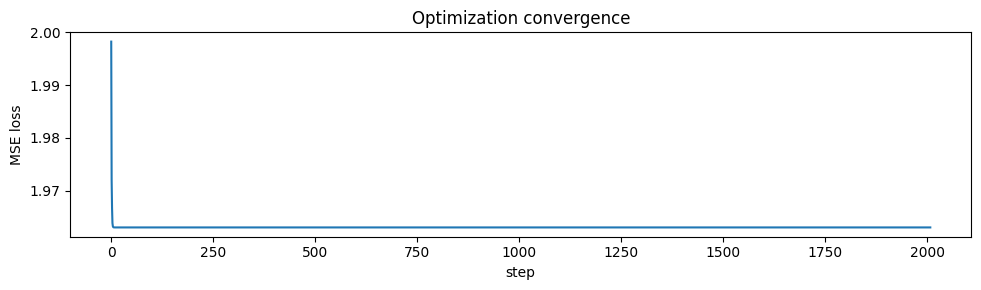

In [38]:
plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Optimization convergence")
plt.tight_layout(); plt.show()

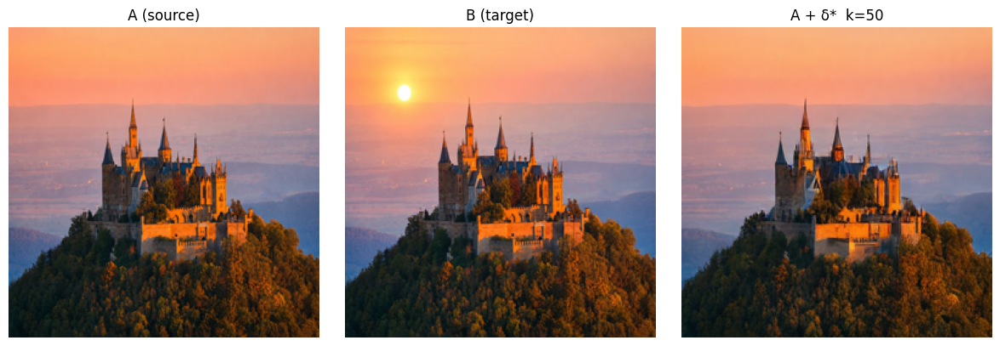

In [39]:
result = delta_forward(tensor_a, delta)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title(f"A + δ*  k={K_SPARSE}")
for ax in axes: ax.axis("off")
plt.tight_layout()
# plt.savefig(os.path.join(OUTPUT_DIR, "optimized_delta.png"), dpi=150, bbox_inches="tight")
plt.show()

In [41]:
print(f"Finding δ*: original → {DISTORTION}  (k={K_SPARSE})")
delta, src_latent, loss_curve = find_optimal_delta(
    tensor_orig, tensor_dist,
    k_sparse  = K_SPARSE,
    n_steps   = N_STEPS,
    step_size = STEP_SIZE,
    patience  = PATIENCE,
)

Finding δ*: original → bw  (k=40)
  step    0  loss=2.610625  step_size=5.0000  nnz=40
  step   50  loss=2.436512  step_size=5.0000  nnz=40
  step  100  loss=2.436512  step_size=5.0000  nnz=40
  step  150  loss=2.436512  step_size=5.0000  nnz=40
  step  200  loss=2.436512  step_size=5.0000  nnz=40
  step  250  loss=2.436512  step_size=5.0000  nnz=40
  step  300  loss=2.436512  step_size=5.0000  nnz=40
  step  350  loss=2.436512  step_size=5.0000  nnz=40
  step  400  loss=2.436512  step_size=5.0000  nnz=40
  step  450  loss=2.436512  step_size=5.0000  nnz=40
  step  500  loss=2.436512  step_size=5.0000  nnz=40
  step  550  loss=2.436512  step_size=5.0000  nnz=40
  step  600  loss=2.436512  step_size=5.0000  nnz=40
  step  650  loss=2.436512  step_size=5.0000  nnz=40
  step  700  loss=2.436512  step_size=5.0000  nnz=40
  step  750  loss=2.436512  step_size=5.0000  nnz=40
  step  800  loss=2.436512  step_size=5.0000  nnz=40
  step  850  loss=2.436512  step_size=5.0000  nnz=40
  step  900 

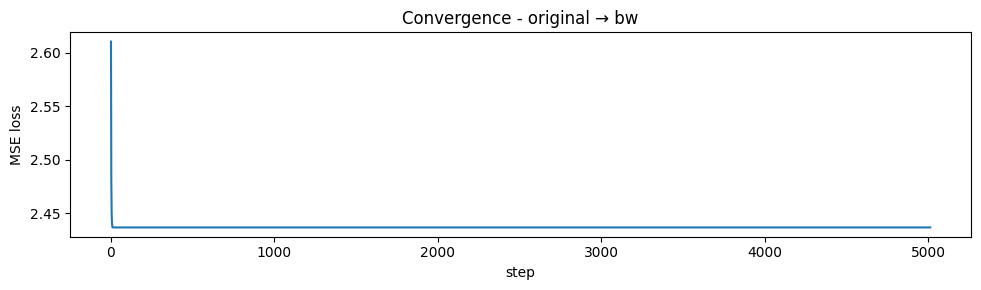

In [42]:
plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title(f"Convergence - original → {DISTORTION}")
plt.tight_layout(); plt.show()

NameError: name 'OUTPUT_DIR' is not defined

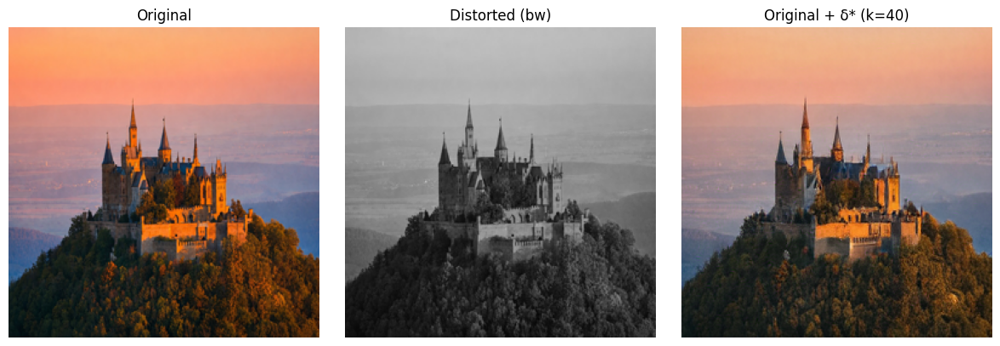

In [43]:
result = delta_forward(tensor_orig, delta)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_orig);             axes[0].set_title("Original")
axes[1].imshow(pil_dist);             axes[1].set_title(f"Distorted ({DISTORTION})")
axes[2].imshow(to_np(result[0]));     axes[2].set_title(f"Original + δ* (k={K_SPARSE})")
for ax in axes: ax.axis("off")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, f"pgd_{DISTORTION}.png"), dpi=150, bbox_inches="tight")
plt.show()

# L1, global delta

In [33]:
def L1_projection(delta, eps):
    abs_d = delta.abs()
    if abs_d.sum() <= eps:
        return delta  \

    sorted_d, _ = abs_d.sort(descending=True)
    cumsum = sorted_d.cumsum(0)
    n      = torch.arange(1, len(sorted_d) + 1, device=delta.device, dtype=delta.dtype)

    rho   = ((sorted_d * n) > (cumsum - eps)).nonzero()[-1].item()
    theta = (cumsum[rho] - eps) / (rho + 1)

    return delta.sign() * (abs_d - theta).clamp(min=0)


def find_optimal_delta_l1(
    tensor_a,
    tensor_b,
    eps            = 500.0,  
    n_steps        = 1000,
    patience       = 50,
    min_delta      = 1e-6,
    verbose        = True,
):
    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    with torch.no_grad():
        act_buffer.clear(); unitok.encoder(tensor_a); src_acts = act_buffer[0]
        act_buffer.clear(); unitok.encoder(tensor_b); tgt_acts = act_buffer[0]
    handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        tgt_latent, _, _, _ = sae.encode(tgt_acts.reshape(B * L, D))
        tgt_recon  = sae.decode(tgt_latent).detach()
        src_latent = src_latent.detach()

    n_fts = sae.hidden_dim  

    alpha          = 1.0
    init_topk      = 0.05            
    adasp_redstep  = 1.5             
    adasp_minstep  = 10.0            
    k_check        = max(int(0.04 * n_steps), 1)

    step_size_t = torch.tensor(alpha * eps, device=device)   
    topk        = torch.tensor(init_topk, device=device)
    sp_old      = torch.tensor(float(n_fts), device=device)

    delta      = torch.zeros(n_fts, device=device)
    delta_old  = delta.clone()
    delta_best = delta.clone()
    grad_best  = torch.zeros_like(delta)
    loss_best  = torch.tensor(float('inf'), device=device)
    loss_steps = []
    counter    = 0
    no_improve = 0

    for step in range(n_steps):
        delta.requires_grad_(True)
        loss = F.mse_loss(sae.decode(src_latent + delta.unsqueeze(0)), tgt_recon)
        grad = torch.autograd.grad(loss, delta)[0].detach()
        delta = delta.detach()

        topk_curr      = int(torch.clamp((1.0 - topk) * n_fts,
                                          min=0, max=n_fts - 1).item())
        grad_sorted_asc = grad.abs().sort()[0]              # ascending
        grad_threshold  = grad_sorted_asc[topk_curr]
        sparsegrad      = grad * (grad.abs() >= grad_threshold).float()

        n_selected = sparsegrad.sign().abs().sum() + 1e-10
        delta_1    = delta - step_size_t * sparsegrad.sign() / n_selected

        delta_1 = L1_projection(delta_1, eps)

        a         = 0.75 if step > 0 else 1.0
        grad2     = delta - delta_old
        delta_old = delta.clone()

        delta_new = delta + (delta_1 - delta) * a + grad2 * (1 - a)
        delta     = L1_projection(delta_new, eps)   

        with torch.no_grad():
            curr_loss = F.mse_loss(sae.decode(src_latent + delta.unsqueeze(0)), tgt_recon)
        loss_steps.append(curr_loss.item())

        if curr_loss < loss_best - min_delta:
            delta_best = delta.clone()
            grad_best  = grad.clone()
            loss_best  = curr_loss.clone()
            no_improve = 0
        else:
            no_improve += 1

        if no_improve >= patience:
            if verbose:
                print(f"  early stop at step {step}  loss={loss_best.item():.6f}")
            break

        counter += 1
        if counter == k_check:
            sp_curr    = (delta_best.abs() > 1e-6).float().sum()  
            fl_redtopk = (sp_curr / sp_old) < 0.95          

            topk = (sp_curr / n_fts / 1.5).clamp(min=1e-6, max=init_topk)

            if fl_redtopk:
                step_size_t = torch.tensor(alpha * eps, device=device)
                delta       = delta_best.clone()
                delta_old   = delta.clone()
                grad        = grad_best.clone()
            else:
                step_size_t = step_size_t / adasp_redstep

            step_size_t = step_size_t.clamp(
                min = alpha * eps / adasp_minstep,
                max = alpha * eps,
            )
            sp_old  = sp_curr.clone()
            counter = 0

        if verbose and step % 50 == 0:
            nnz = (delta.abs() > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={curr_loss.item():.6f}  "
                  f"step_size={step_size_t.item():.2f}  "
                  f"topk={topk.item():.4f}  nnz={nnz}")

    return delta_best.clone(), src_latent, tgt_latent, loss_steps

AutoPGD-L1  eps=40000.0  max_steps=5000  patience=2000
  step    0  loss=38928.585938  step_size=40000.00  topk=0.0500  nnz=410
  step   50  loss=11901.877930  step_size=40000.00  topk=0.0500  nnz=801
  step  100  loss=12162.308594  step_size=40000.00  topk=0.0500  nnz=800
  step  150  loss=12070.822266  step_size=40000.00  topk=0.0500  nnz=795
  step  200  loss=14324.324219  step_size=40000.00  topk=0.0500  nnz=1123
  step  250  loss=13377.032227  step_size=40000.00  topk=0.0500  nnz=728
  step  300  loss=13341.992188  step_size=40000.00  topk=0.0500  nnz=725
  step  350  loss=13333.450195  step_size=40000.00  topk=0.0500  nnz=727
  step  400  loss=1439.032227  step_size=26666.67  topk=0.0500  nnz=723
  step  450  loss=2155.532227  step_size=26666.67  topk=0.0500  nnz=892
  step  500  loss=2120.719971  step_size=26666.67  topk=0.0500  nnz=882
  step  550  loss=2127.628906  step_size=26666.67  topk=0.0500  nnz=878
  step  600  loss=32848.714844  step_size=40000.00  topk=0.0500  nnz=767

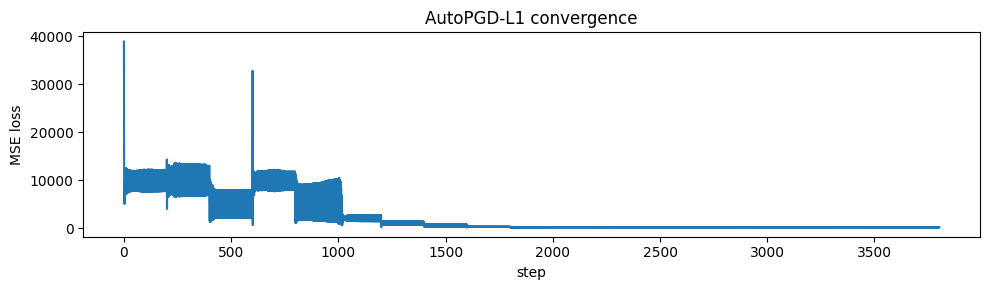

In [45]:
EPS       = 40000.0  
N_STEPS   = 5000
PATIENCE  = 2000

print(f"AutoPGD-L1  eps={EPS}  max_steps={N_STEPS}  patience={PATIENCE}")
delta_l1, src_latent, tgt_latent, loss_curve = find_optimal_delta_l1(
    tensor_a, tensor_b,
    eps      = EPS,
    n_steps  = N_STEPS,
    patience = PATIENCE,
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("AutoPGD-L1 convergence")
plt.tight_layout(); plt.show()

In [46]:
with torch.no_grad():
    tgt_recon = sae.decode(tgt_latent)
    baseline  = F.mse_loss(sae.decode(src_latent), tgt_recon)
    optimized = F.mse_loss(sae.decode(src_latent + delta_l1.unsqueeze(0)), tgt_recon)
print(f"Baseline loss: {baseline.item():.3f}")
print(f"Optimized:     {optimized.item():.3f}")
print(f"Reduction:     {(1 - optimized/baseline)*100:.1f}%")

Baseline loss: 77.271
Optimized:     143.900
Reduction:     -86.2%


NameError: name 'OUTPUT_DIR' is not defined

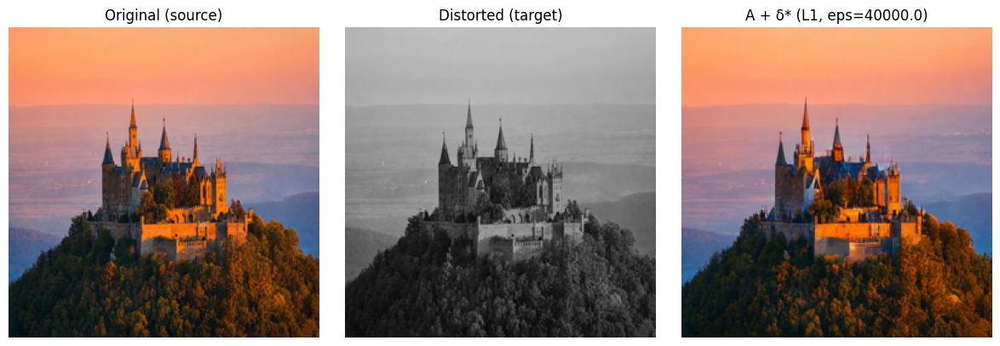

In [47]:
result = delta_forward(tensor_orig, delta_l1)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_orig.resize((256, 256))); axes[0].set_title("Original (source)")
axes[1].imshow(pil_dist.resize((256, 256))); axes[1].set_title("Distorted (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title(f"A + δ* (L1, eps={EPS})")
for ax in axes: ax.axis("off")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "pgd_l1.png"), dpi=150, bbox_inches="tight")
plt.show()

## diagnostic cell

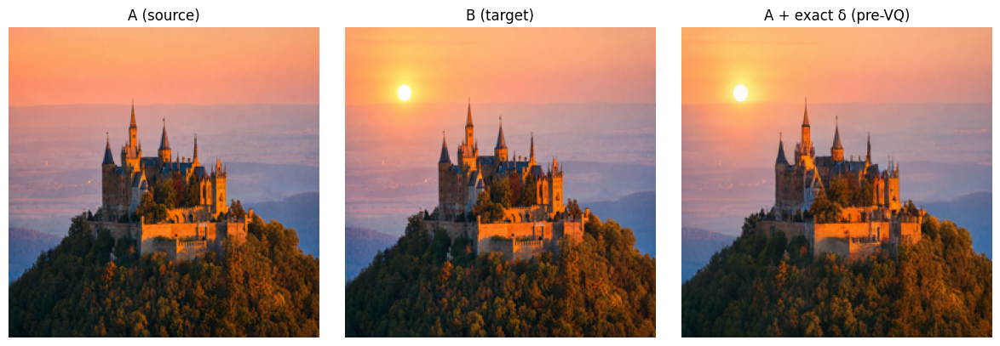

In [9]:
@torch.no_grad()
def diagnose_prevq(tensor_a, tensor_b):
    src_prevq = unitok.quant_proj(unitok.encoder(tensor_a).float())  # (1, 64, d)
    tgt_prevq = unitok.quant_proj(unitok.encoder(tensor_b).float())  # (1, 64, d)
    delta_prevq = tgt_prevq - src_prevq  

    shifted = src_prevq + delta_prevq 
    img_tokens, _, _, _ = unitok.quantizer(shifted)
    img_tokens = unitok.post_quant_proj(img_tokens)
    img_rec = denorm(unitok.decoder(img_tokens).clamp(-1, 1))

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
    axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
    axes[2].imshow(to_np(img_rec[0]));        axes[2].set_title("A + exact δ (pre-VQ)")
    for ax in axes: ax.axis("off")
    plt.tight_layout(); plt.show()

diagnose_prevq(tensor_a, tensor_b)

# Global delta, pre-VQ tokens

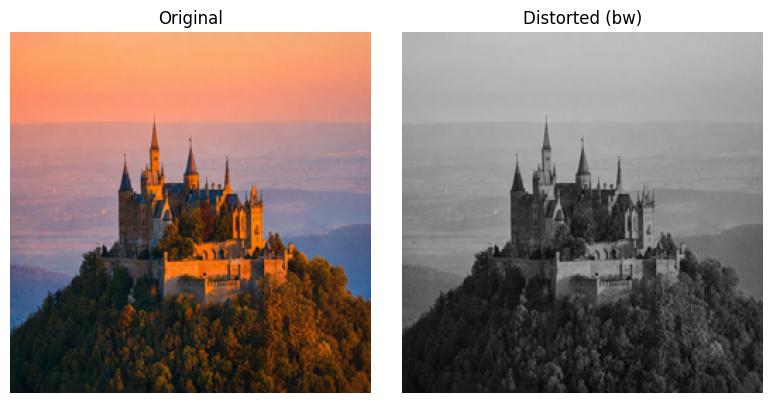

In [9]:
IMAGE_PATH   = "/scratch/work/vuh12/UniTok/sae/castle.jpg"
DISTORTION   = "bw"    
K_SPARSE     = 40
N_STEPS      = 10000
STEP_SIZE    = 5
PATIENCE     = 5000

pil_orig = Image.open(IMAGE_PATH).convert("RGB").resize((256, 256))

if DISTORTION == "blur":
    from PIL import ImageFilter
    pil_dist = pil_orig.filter(ImageFilter.GaussianBlur(radius=5))

elif DISTORTION == "noise":
    import numpy as np
    arr  = np.array(pil_orig).astype(np.float32)
    arr += np.random.normal(0, 30, arr.shape)
    pil_dist = Image.fromarray(arr.clip(0, 255).astype(np.uint8))

elif DISTORTION == "bw":
    pil_dist = pil_orig.convert("L").convert("RGB")

elif DISTORTION == "jpeg":
    import io
    buf = io.BytesIO()
    pil_orig.save(buf, format="JPEG", quality=5)
    pil_dist = Image.open(buf).convert("RGB")

transform    = make_transform()
tensor_orig  = transform(pil_orig).unsqueeze(0).to(device)
tensor_dist  = transform(pil_dist).unsqueeze(0).to(device)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(pil_orig); axes[0].set_title("Original");              axes[0].axis("off")
axes[1].imshow(pil_dist); axes[1].set_title(f"Distorted ({DISTORTION})"); axes[1].axis("off")
plt.tight_layout(); plt.show()

In [22]:
# Delta (1, 8292) and MSE loss between pre-VQ tokens, with ReduceLROnPlateau scheduler and dense feature ablation
def find_delta_prevq(tensor_a, tensor_b, lr=10.0, n_steps=10000, eps=1000.0, verbose=True, dense_mask=None, lambda_l1 = 0.0, warmup_steps=500):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    with torch.no_grad():
        unitok.encoder(tensor_a)
        src_acts = act_buffer[0]
    handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(sae.hidden_dim, device=device, requires_grad=True)
    optimizer = torch.optim.SGD([delta], lr=lr)
    warmup_scheduler = torch.optim.lr_scheduler.LinearLR(
        optimizer, start_factor=0.01, end_factor=1.0, total_iters=warmup_steps
    )
    cosine_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=n_steps - warmup_steps, eta_min=lr * 0.001
    )
    scheduler = torch.optim.lr_scheduler.SequentialLR(
        optimizer, schedulers=[warmup_scheduler, cosine_scheduler], milestones=[warmup_steps]
    )
    # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2000, factor=0.5, min_lr=lr * 0.001)
    # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_steps,  eta_min=lr * 0.001)
    
    loss_steps = []
    lr_steps = []

    for step in range(n_steps):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta.unsqueeze(0)).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[10].register_forward_hook(_hook)
        src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        handle.remove()

        loss = F.mse_loss(src_tokens, tgt_tokens) + lambda_l1 * delta.abs().sum()
        loss.backward()
        optimizer.step()
        if dense_mask is not None:
            with torch.no_grad():
                delta[dense_mask] = 0.0
        # scheduler.step(loss.item())
        scheduler.step()
        # with torch.no_grad():
        #     delta.data = L1_projection(delta.data, eps)
        loss_steps.append(loss.item())
        lr_steps.append(optimizer.param_groups[0]['lr'])
        if verbose and step % 500 == 0:
            nnz = (delta.abs() > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                 f"lr={optimizer.param_groups[0]['lr']:.5f}  "
                 f"nnz={nnz}")

    return delta.detach(), src_latent, loss_steps

  step    0  loss=2.853508  lr=0.11980  nnz=7840
  step  500  loss=2.890105  lr=10.00000  nnz=8070
  step 1000  loss=2.887599  lr=9.69757  nnz=8072
  step 1500  loss=2.883348  lr=8.82915  nnz=8071
  step 2000  loss=2.877909  lr=7.49948  nnz=8071
  step 2500  loss=2.871529  lr=5.86894  nnz=8071
  step 3000  loss=2.864442  lr=4.13419  nnz=8067
  step 3500  loss=2.858080  lr=2.50448  nnz=8069
  step 4000  loss=2.853070  lr=1.17637  nnz=8057
  step 4500  loss=2.849787  lr=0.31004  nnz=8022


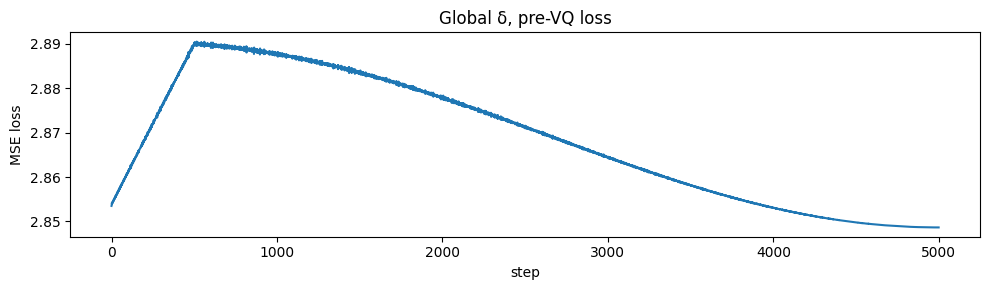

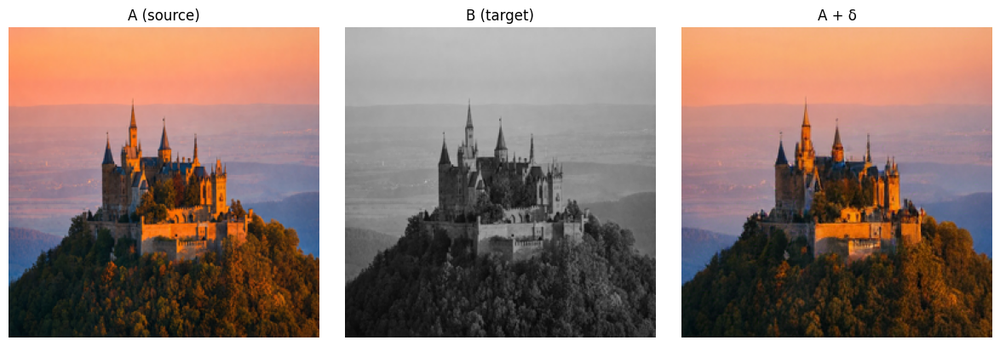

In [24]:
delta_bw, src_latent, loss_curve = find_delta_prevq(
    tensor_orig, tensor_dist, lr=10.0, n_steps=5000, dense_mask=dense_mask, lambda_l1=0.001, warmup_steps=500
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Global δ, pre-VQ loss")
plt.tight_layout(); plt.show()

result = delta_forward(tensor_orig, delta_bw)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_orig.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_dist.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

  step    0  loss=2.263314  lr=99.99999  nnz=8072
  step  500  loss=41.209702  lr=97.54557  nnz=8072
  step 1000  loss=38.688324  lr=90.44194  nnz=8072
  step 1500  loss=34.405895  lr=79.38448  nnz=8072
  step 2000  loss=28.843813  lr=65.45555  nnz=8072
  step 2500  loss=22.586308  lr=50.01862  nnz=8072
  step 3000  loss=16.187683  lr=34.58476  nnz=8072
  step 3500  loss=10.568913  lr=20.66474  nnz=8072
  step 4000  loss=6.139137  lr=9.62116  nnz=8071
  step 4500  loss=3.288563  lr=2.53504  nnz=8072


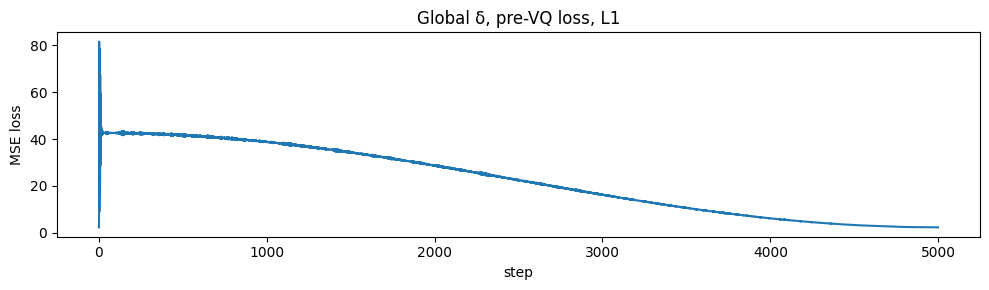

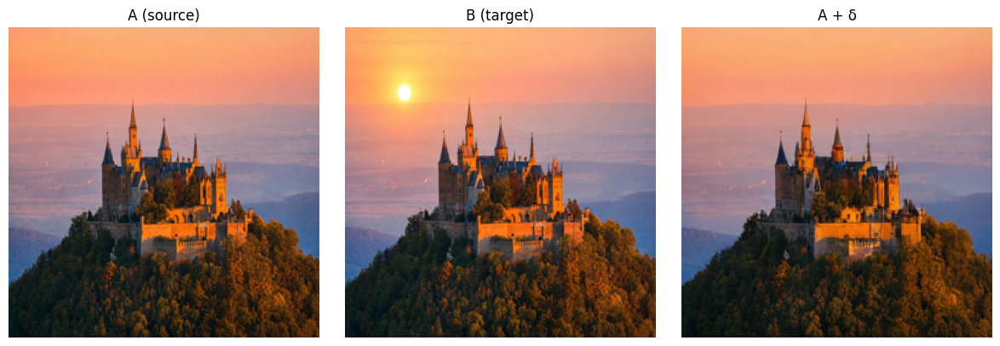

In [18]:
delta_curr, src_latent_curr, loss_curve_curr = find_delta_prevq(tensor_a, tensor_b, lr=100.0, n_steps=5000, dense_mask=dense_mask, lambda_l1=0.01)

plt.figure(figsize=(10,3))
plt.plot(loss_curve_curr)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Global δ, pre-VQ loss")
plt.tight_layout(); plt.show()

result_curr = delta_forward(tensor_a, delta_curr)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result_curr[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

# supervised global delta, preVQ tokens

In [25]:
def find_delta_global(tensor_a, tensor_b, lr=10.0, n_steps=10000, verbose=True, dense_mask=None, k_c = 64):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()
        src_tokens_ref = unitok.quant_proj(unitok.encoder(tensor_a).float()).detach()
        patch_diff = (tgt_tokens - src_tokens_ref).norm(dim=-1).squeeze(0)  # (L,)
        c_idx      = patch_diff.topk(k_c).indices

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    with torch.no_grad():
        unitok.encoder(tensor_a)
        src_acts = act_buffer[0]
    handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(sae.hidden_dim, device=device, requires_grad=True)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2000, factor=0.5, min_lr=lr * 0.001)
    loss_steps = []
    lr_steps = []

    for step in range(1, n_steps+1):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta.unsqueeze(0)).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        handle.remove()

        loss = F.mse_loss(src_tokens[:, c_idx], tgt_tokens[:, c_idx])
        loss.backward()
        optimizer.step()
        if dense_mask is not None:
            with torch.no_grad():
                delta[dense_mask] = 0.0
        scheduler.step(loss.item())
        # with torch.no_grad():
        #     delta.data = L1_projection(delta.data, eps)
        loss_steps.append(loss.item())
        lr_steps.append(optimizer.param_groups[0]['lr'])
        if verbose and step % 500 == 0:
            nnz = (delta.abs() > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                 f"lr={optimizer.param_groups[0]['lr']:.5f}  "
                 f"nnz={nnz}")

    return delta.detach(), src_latent, loss_steps

## small change in image

  step  500  loss=3.221003  lr=120.00000  nnz=8072
  step 1000  loss=3.146504  lr=120.00000  nnz=8072
  step 1500  loss=3.098473  lr=120.00000  nnz=8072
  step 2000  loss=3.051538  lr=120.00000  nnz=8072
  step 2500  loss=2.994458  lr=120.00000  nnz=8072
  step 3000  loss=2.920647  lr=120.00000  nnz=8072
  step 3500  loss=2.835931  lr=120.00000  nnz=8072
  step 4000  loss=2.732240  lr=120.00000  nnz=8072
  step 4500  loss=2.595768  lr=120.00000  nnz=8072
  step 5000  loss=2.470889  lr=120.00000  nnz=8072
  step 5500  loss=2.396439  lr=120.00000  nnz=8072
  step 6000  loss=2.350228  lr=120.00000  nnz=8072
  step 6500  loss=2.312156  lr=120.00000  nnz=8072
  step 7000  loss=2.278031  lr=120.00000  nnz=8072
  step 7500  loss=2.266979  lr=120.00000  nnz=8072
  step 8000  loss=2.237480  lr=120.00000  nnz=8072
  step 8500  loss=2.191220  lr=120.00000  nnz=8072
  step 9000  loss=2.190302  lr=120.00000  nnz=8072
  step 9500  loss=2.191062  lr=120.00000  nnz=8072
  step 10000  loss=2.165595  lr

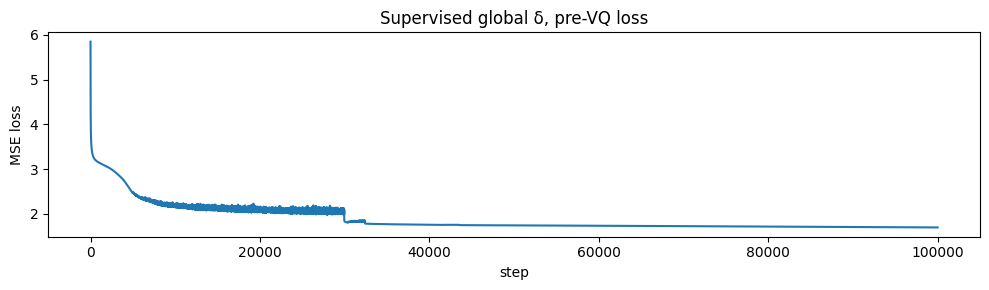

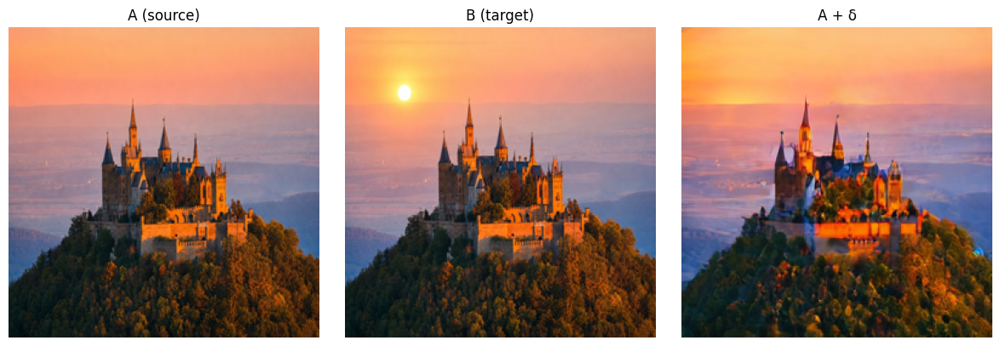

In [30]:
delta_global, src_latent, loss_curve = find_delta_global(
    tensor_a, tensor_b, lr=120.0, n_steps=100000, dense_mask=dense_mask, k_c=50,
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Supervised global δ, pre-VQ loss")
plt.tight_layout(); plt.show()

result = delta_forward(tensor_a, delta_global)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

## big change in image

In [26]:
@torch.no_grad()
def get_active_features(img_tensor):
    """Returns (L, k) indices of active SAE features per patch."""
    buf = []
    def _hook(m, i, o): buf.append(o.float())
    h = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        unitok.encoder(img_tensor)
    finally:
        h.remove()
    B, L, D = buf[0].shape
    latents, topk_idx, _, _ = sae.encode(buf[0].reshape(B * L, D))
    return topk_idx.reshape(L, sae.k), latents.reshape(L, -1)   # (L, k)

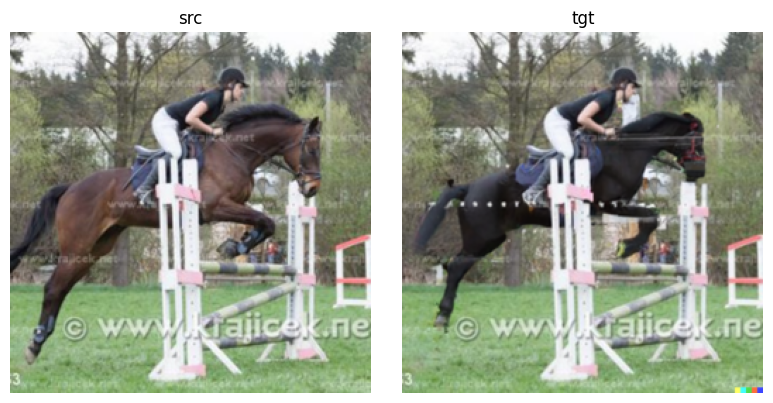

In [27]:
src = Image.open("/scratch/work/vuh12/UniTok/sae/pairs/source_img.png")
tgt = Image.open("/scratch/work/vuh12/UniTok/sae/pairs/target_img.png")
transform = make_transform()

pil_src = src.convert("RGB").resize((256, 256))
pil_tgt = tgt.convert("RGB").resize((256, 256))

tensor_src = transform(pil_src).unsqueeze(0).to(device)
tensor_target = transform(pil_tgt).unsqueeze(0).to(device)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(pil_src.resize((256, 256))); axes[0].set_title("src"); axes[0].axis("off")
axes[1].imshow(pil_tgt.resize((256, 256))); axes[1].set_title("tgt"); axes[1].axis("off")
plt.tight_layout(); plt.show()

In [28]:
def find_delta_global(tensor_a, tensor_b, lr=10.0, n_steps=10000, verbose=True, dense_mask=None, k_c = 64):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()
        idx_a, _ = get_active_features(tensor_a)  # (L, k)
        idx_b, _ = get_active_features(tensor_b)  # (L, k)
        L = idx_a.shape[0]
        turnover = torch.zeros(L)
        for p in range(L):
            set_a_p = set(idx_a[p].tolist())
            set_b_p = set(idx_b[p].tolist())
            turnover[p] = len(set_a_p.symmetric_difference(set_b_p))
        c_idx = turnover.topk(k_c).indices.to(device)

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    with torch.no_grad():
        unitok.encoder(tensor_a)
        src_acts = act_buffer[0]
    handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(sae.hidden_dim, device=device, requires_grad=True)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2000, factor=0.5, min_lr=lr * 0.001)
    loss_steps = []
    lr_steps = []

    for step in range(1, n_steps+1):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta.unsqueeze(0)).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        handle.remove()

        loss = F.mse_loss(src_tokens[:, c_idx], tgt_tokens[:, c_idx])
        loss.backward()
        optimizer.step()
        if dense_mask is not None:
            with torch.no_grad():
                delta[dense_mask] = 0.0
        scheduler.step(loss.item())
        # with torch.no_grad():
        #     delta.data = L1_projection(delta.data, eps)
        loss_steps.append(loss.item())
        lr_steps.append(optimizer.param_groups[0]['lr'])
        if verbose and step % 500 == 0:
            nnz = (delta.abs() > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                 f"lr={optimizer.param_groups[0]['lr']:.5f}  "
                 f"nnz={nnz}")

    return delta.detach(), src_latent, loss_steps, turnover

  step  500  loss=4.343866  lr=150.00000  nnz=8072
  step 1000  loss=4.153568  lr=150.00000  nnz=8072
  step 1500  loss=4.006430  lr=150.00000  nnz=8072
  step 2000  loss=3.934649  lr=150.00000  nnz=8072
  step 2500  loss=3.888042  lr=150.00000  nnz=8072
  step 3000  loss=3.863591  lr=150.00000  nnz=8072
  step 3500  loss=3.819174  lr=150.00000  nnz=8072
  step 4000  loss=3.896199  lr=150.00000  nnz=8072
  step 4500  loss=3.980243  lr=150.00000  nnz=8072
  step 5000  loss=3.929926  lr=150.00000  nnz=8072
  step 5500  loss=3.780769  lr=150.00000  nnz=8072
  step 6000  loss=3.794082  lr=150.00000  nnz=8072
  step 6500  loss=3.765023  lr=150.00000  nnz=8072
  step 7000  loss=3.781550  lr=150.00000  nnz=8072
  step 7500  loss=3.776339  lr=150.00000  nnz=8072
  step 8000  loss=3.799559  lr=150.00000  nnz=8072
  step 8500  loss=3.756303  lr=150.00000  nnz=8072
  step 9000  loss=3.756944  lr=150.00000  nnz=8072
  step 9500  loss=3.731288  lr=150.00000  nnz=8072
  step 10000  loss=3.836767  lr

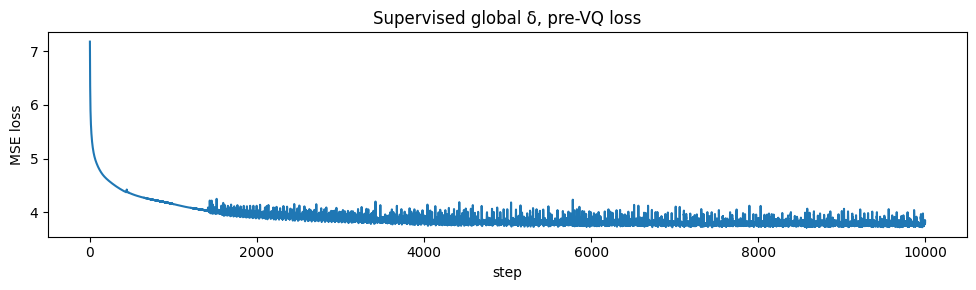

In [15]:
delta_global_curr, src_latent_curr, loss_curve_curr, turnover = find_delta_global(
    tensor_src, tensor_target, lr=150.0, n_steps=10000, dense_mask=dense_mask, k_c=80,
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve_curr)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Supervised global δ, pre-VQ loss")
plt.tight_layout(); plt.show()

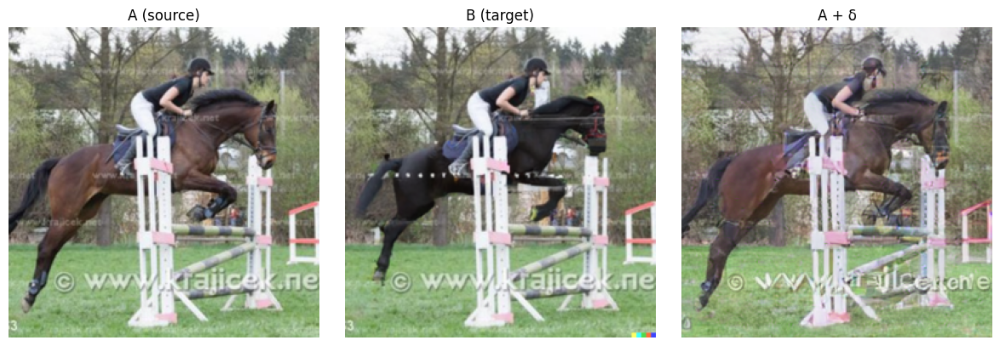

In [16]:
result_curr = delta_forward(tensor_src, delta_global_curr)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_src.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_tgt.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result_curr[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

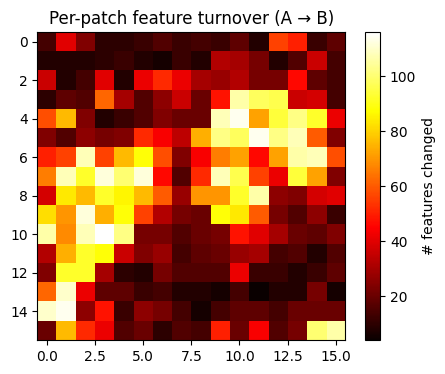

53


In [21]:
plt.figure(figsize=(5, 4))
plt.imshow(turnover.reshape(16, 16).numpy(), cmap="hot")
plt.colorbar(label="# features changed")
plt.title("Per-patch feature turnover (A → B)")
plt.show()
print(len([t for t in turnover if t >= 75]))

# Simple GD, patchwise delta, LR scheduler (reduce LR when loss is plateauing)

  step    0  loss=2.226453  lr=50.00000
  step  500  loss=1.227628  lr=50.00000
  step 1000  loss=0.819463  lr=50.00000
  step 1500  loss=0.589281  lr=50.00000
  step 2000  loss=0.440929  lr=50.00000
  step 2500  loss=0.338544  lr=50.00000
  step 3000  loss=0.266342  lr=50.00000
  step 3500  loss=0.213781  lr=50.00000
  step 4000  loss=0.174337  lr=50.00000
  step 4500  loss=0.144010  lr=50.00000
  step 5000  loss=0.120215  lr=50.00000
  step 5500  loss=0.101228  lr=50.00000
  step 6000  loss=0.085905  lr=50.00000
  step 6500  loss=0.073479  lr=50.00000
  step 7000  loss=0.063345  lr=50.00000
  step 7500  loss=0.055010  lr=50.00000
  step 8000  loss=0.048098  lr=50.00000
  step 8500  loss=0.042318  lr=50.00000
  step 9000  loss=0.037449  lr=50.00000
  step 9500  loss=0.033318  lr=50.00000


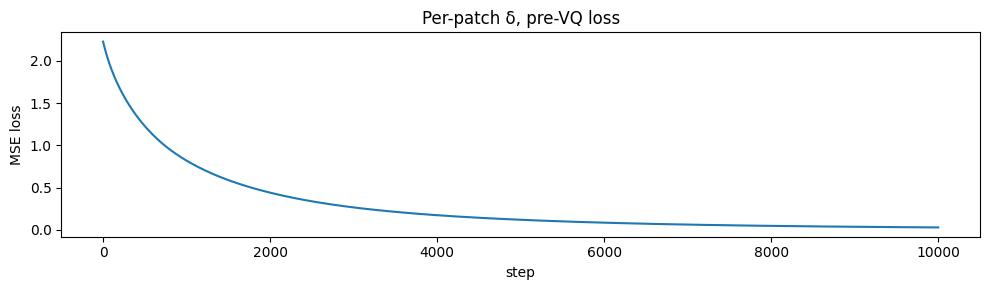

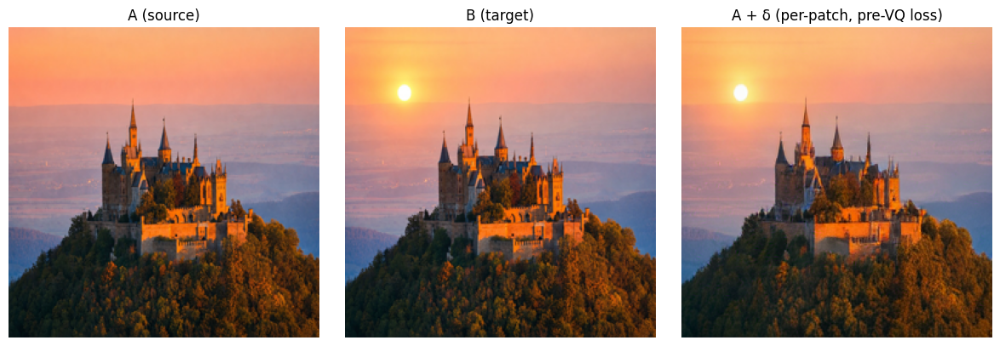

In [7]:
def find_delta_patchwise_prevq(tensor_a, tensor_b, lr=10.0, n_steps=5000, verbose=True):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    try:
        with torch.no_grad():
            unitok.encoder(tensor_a)
            src_acts = act_buffer[0]
    finally:
        handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(L, sae.hidden_dim, device=device, requires_grad=True)  # (64, 8192)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2000, factor=0.5, min_lr=lr * 0.001)
    loss_steps = []
    lr_steps = []

    for step in range(n_steps):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        try:
            src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        finally:
            handle.remove()

        loss = F.mse_loss(src_tokens, tgt_tokens)
        loss.backward()
        optimizer.step()
        scheduler.step(loss.item())
        # grad = torch.autograd.grad(loss, delta)[0].detach()
        # delta = delta.detach()
        # delta = delta - lr * grad
        loss_steps.append(loss.item())
        lr_steps.append(optimizer.param_groups[0]['lr'])
        if verbose and step % 500 == 0:
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                  f"lr={optimizer.param_groups[0]['lr']:.5f}")

    return delta.detach(), src_latent, loss_steps


delta_pw, src_latent, loss_curve = find_delta_patchwise_prevq(
    tensor_a, tensor_b, lr=50.0, n_steps=10000
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Per-patch δ, pre-VQ loss")
plt.tight_layout(); plt.show()


@torch.no_grad()
def delta_patchwise_forward(imgs, delta):
    def _hook(module, inp, out):
        B, L, D = out.shape
        latent, _, _, _ = sae.encode(out.float().reshape(B * L, D))
        latent = latent + delta
        return sae.decode(latent).reshape(B, L, D).to(out.dtype)
    handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
    try:
        img_tokens = unitok.encoder(imgs).float()
        img_tokens = unitok.quant_proj(img_tokens)
        img_tokens, _, _, _ = unitok.quantizer(img_tokens)
        img_tokens = unitok.post_quant_proj(img_tokens)
        img_rec = unitok.decoder(img_tokens).clamp(-1, 1)
    finally:
        handle.remove()
    return denorm(img_rec)

result = delta_patchwise_forward(tensor_a, delta_pw)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title("A + δ (per-patch, pre-VQ loss)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

In [ ]:
print(f"delta shape: {delta_pw.shape}")
print(f"unitok.num_query: {unitok.num_query}")

# Optimization on other distortions (BW, jpeg)

  step    0  loss=2.779562  lr=50.00000
  step  500  loss=1.550556  lr=50.00000
  step 1000  loss=1.038667  lr=50.00000
  step 1500  loss=0.740681  lr=50.00000
  step 2000  loss=0.544537  lr=50.00000
  step 2500  loss=0.412253  lr=50.00000
  step 3000  loss=0.318732  lr=50.00000
  step 3500  loss=0.250276  lr=50.00000
  step 4000  loss=0.198970  lr=50.00000
  step 4500  loss=0.160031  lr=50.00000
  step 5000  loss=0.130193  lr=50.00000
  step 5500  loss=0.107085  lr=50.00000
  step 6000  loss=0.088987  lr=50.00000
  step 6500  loss=0.074658  lr=50.00000
  step 7000  loss=0.063199  lr=50.00000
  step 7500  loss=0.053947  lr=50.00000
  step 8000  loss=0.046409  lr=50.00000
  step 8500  loss=0.040215  lr=50.00000
  step 9000  loss=0.035082  lr=50.00000
  step 9500  loss=0.030794  lr=50.00000


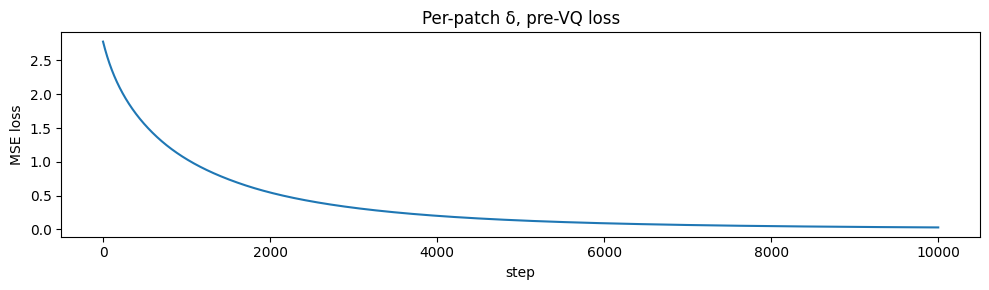

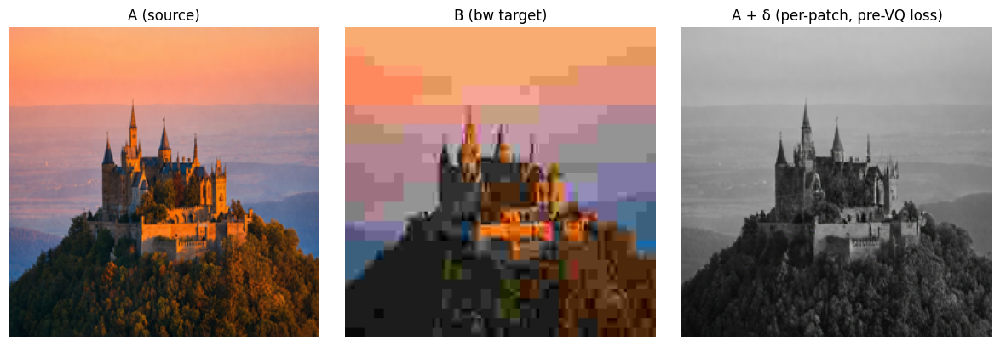

In [47]:
delta_pw_bw, src_latent, loss_curve = find_delta_patchwise_prevq(tensor_orig, tensor_dist, lr=50.0, n_steps=10000)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Per-patch δ, pre-VQ loss")
plt.tight_layout(); plt.show()

results = delta_patchwise_forward(tensor_orig, delta_pw_bw)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_orig.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_dist.resize((256, 256))); axes[1].set_title("B (bw target)")
axes[2].imshow(to_np(results[0]));         axes[2].set_title("A + δ (per-patch, pre-VQ loss)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

torch.Size([256, 8192])


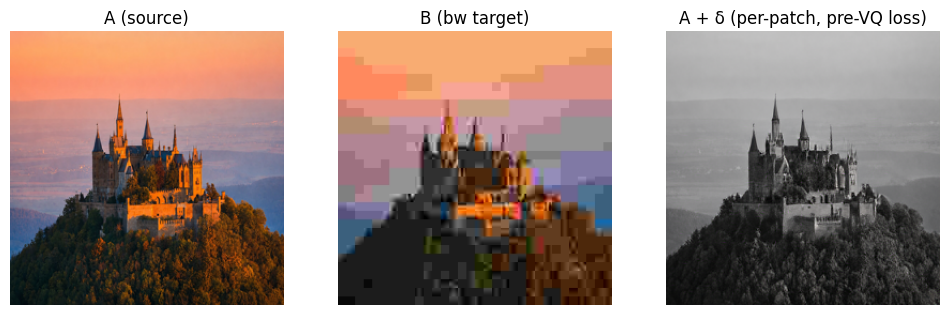

In [66]:
CURR_DELTA = delta_pw_bw.clone()
feature_importance = CURR_DELTA.abs().sum(dim=0)   
topk_indices = feature_importance.topk(4000).indices
mask = torch.zeros(sae.hidden_dim, device=device)
mask[topk_indices] = 1.0
CURR_DELTA.data *= mask.unsqueeze(0)
print(CURR_DELTA.shape)
results = delta_patchwise_forward(tensor_orig, CURR_DELTA)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_orig.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_dist.resize((256, 256))); axes[1].set_title("B (bw target)")
axes[2].imshow(to_np(results[0]));         axes[2].set_title("A + δ (per-patch, pre-VQ loss)")
for ax in axes: ax.axis("off")

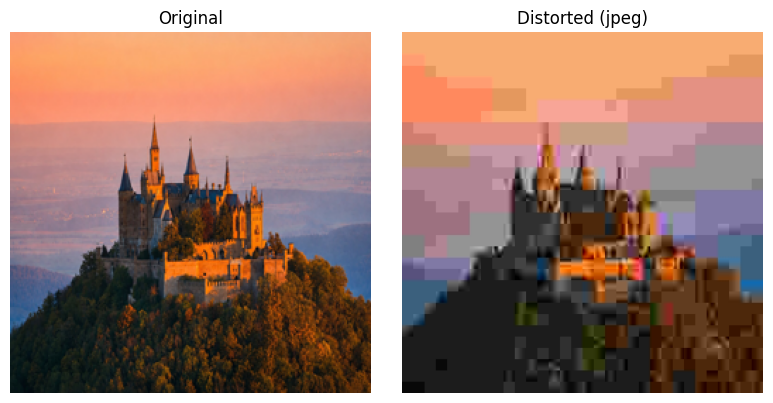

In [13]:
DISTORTION = "jpeg"

import io
buf = io.BytesIO()
pil_orig.save(buf, format="JPEG", quality=5)
pil_dist = Image.open(buf).convert("RGB")

transform    = make_transform()
tensor_target_jpeg  = transform(pil_orig).unsqueeze(0).to(device)
tensor_source_jpeg  = transform(pil_dist).unsqueeze(0).to(device)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(pil_orig); axes[0].set_title("Original");              axes[0].axis("off")
axes[1].imshow(pil_dist); axes[1].set_title(f"Distorted ({DISTORTION})"); axes[1].axis("off")
plt.tight_layout(); plt.show()

  step    0  loss=6.449251  lr=50.00000
  step  500  loss=3.741545  lr=50.00000
  step 1000  loss=2.644236  lr=50.00000
  step 1500  loss=2.008459  lr=50.00000
  step 2000  loss=1.558341  lr=50.00000
  step 2500  loss=1.228594  lr=50.00000
  step 3000  loss=0.983852  lr=50.00000
  step 3500  loss=0.799576  lr=50.00000
  step 4000  loss=0.657518  lr=50.00000
  step 4500  loss=0.546170  lr=50.00000
  step 5000  loss=0.459410  lr=50.00000
  step 5500  loss=0.388933  lr=50.00000
  step 6000  loss=0.332282  lr=50.00000
  step 6500  loss=0.284251  lr=50.00000
  step 7000  loss=0.245546  lr=50.00000
  step 7500  loss=0.212334  lr=50.00000
  step 8000  loss=0.184850  lr=50.00000
  step 8500  loss=0.161985  lr=50.00000
  step 9000  loss=0.141978  lr=50.00000
  step 9500  loss=0.125577  lr=50.00000


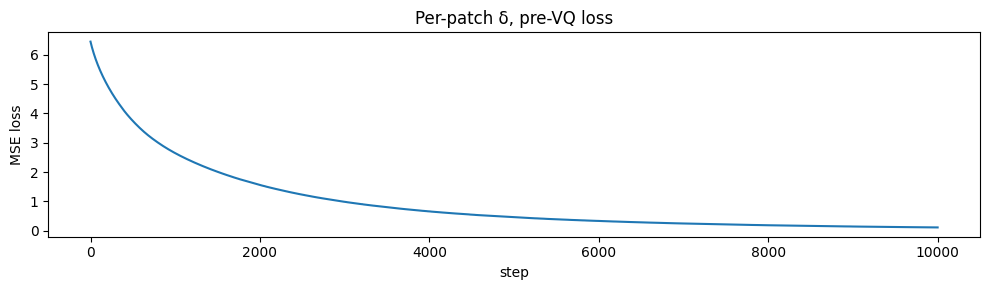

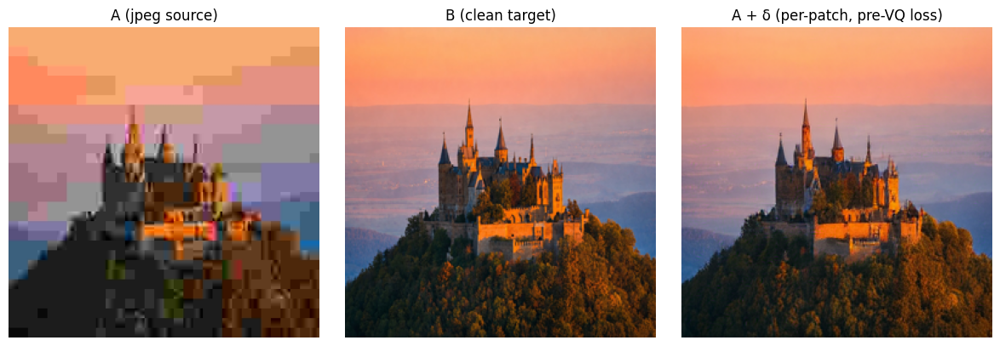

In [14]:
delta_pw_jpeg, src_latent, loss_curve = find_delta_patchwise_prevq(tensor_source_jpeg, tensor_target_jpeg, lr=50.0, n_steps=10000)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Per-patch δ, pre-VQ loss")
plt.tight_layout(); plt.show()

results = delta_patchwise_forward(tensor_source_jpeg, delta_pw_jpeg)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_dist.resize((256, 256))); axes[0].set_title("A (jpeg source)")
axes[1].imshow(pil_orig.resize((256, 256))); axes[1].set_title("B (clean target)")
axes[2].imshow(to_np(results[0])); axes[2].set_title("A + δ (per-patch, pre-VQ loss)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

## Applying δ on unseen images

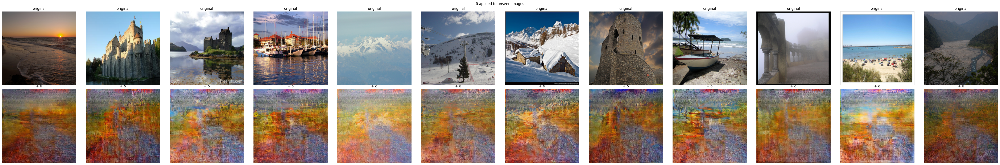

In [70]:
OUTDOOR_SYNSETS = {"n09332890", "n09428293", "n09193705", "n09468604", "n02980441"} # lakeside, seashore, alp, valley, castle
dataset_plain = ImageFolder(IMAGENET_VAL)
test_candidates = [
    path for path, label in dataset_plain.samples if dataset_plain.classes[label] in OUTDOOR_SYNSETS]

import random
random.seed(42)
test_paths = random.sample(test_candidates, 12)

n = len(test_paths)
fig, axes = plt.subplots(2, n, figsize=(4 * n, 8))

for i, path in enumerate(test_paths):
    pil = Image.open(path).convert("RGB")
    tensor = transform(pil).unsqueeze(0).to(device)
    result = delta_patchwise_forward(tensor, CURR_DELTA * 5)
    axes[0, i].imshow(pil.resize((256, 256))); axes[0, i].set_title("original")
    axes[1, i].imshow(to_np(result[0]));       axes[1, i].set_title("+ δ")
    for ax in axes[:, i]: ax.axis("off")

plt.suptitle("δ applied to unseen images")
plt.tight_layout(); plt.show()

## Extrapolation/interpolation of δ

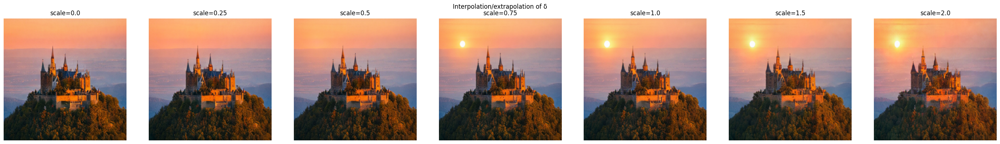

In [23]:
scales = [0.0, 0.25, 0.5, 0.75, 1.0, 1.5, 2.0]

fig, axes = plt.subplots(1, len(scales), figsize=(4 * len(scales), 4))
for i, scale in enumerate(scales):
    result = delta_patchwise_forward(tensor_a, delta_pw_bw * scale)
    axes[i].imshow(to_np(result[0]))
    axes[i].set_title(f"scale={scale}")
    axes[i].axis("off")
plt.suptitle("Interpolation/extrapolation of δ")
plt.tight_layout(); plt.show()

## Adding sparsity back 

In [36]:
# change lr scheduler to CosineAnnealingLR
def find_delta_patchwise_prevq(tensor_a, tensor_b, lr=50.0, n_steps=10000, k_features=32, verbose=True):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    try:
        with torch.no_grad():
            unitok.encoder(tensor_a)
            src_acts = act_buffer[0]
    finally:
        handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(L, sae.hidden_dim, device=device, requires_grad=True)  # (64, 8192)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_steps, eta_min=lr * 0.01)
    loss_steps = []
    lr_steps = []

    for step in range(n_steps):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        try:
            src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        finally:
            handle.remove()

        loss = F.mse_loss(src_tokens, tgt_tokens)
        loss.backward()
        optimizer.step()
        scheduler.step()

        with torch.no_grad():
            feature_importance = delta.abs().max(dim=0).values   
            topk_indices = feature_importance.topk(k_features).indices
            mask = torch.zeros(sae.hidden_dim, device=device)
            mask[topk_indices] = 1.0
            delta.data *= mask.unsqueeze(0)   

        loss_steps.append(loss.item())
        if verbose and step % 500 == 0:
            nnz = (delta.abs().max(dim=0).values > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={loss.item():.6f}  "
                  f"lr={optimizer.param_groups[0]['lr']:.4f}  "
                  f"active_features={nnz}")

    return delta.detach(), src_latent, loss_steps

  step    0  loss=2.226453  lr=50.0000  active_features=32
  step  500  loss=2.109323  lr=49.9234  active_features=32
  step 1000  loss=2.011430  lr=49.6947  active_features=32
  step 1500  loss=1.929776  lr=49.3152  active_features=32
  step 2000  loss=1.861678  lr=48.7874  active_features=32
  step 2500  loss=1.804816  lr=48.1145  active_features=32
  step 3000  loss=1.757226  lr=47.3006  active_features=32
  step 3500  loss=1.717276  lr=46.3508  active_features=32
  step 4000  loss=1.683619  lr=45.2709  active_features=32
  step 4500  loss=1.655152  lr=44.0675  active_features=32
  step 5000  loss=1.630977  lr=42.7481  active_features=32
  step 5500  loss=1.610363  lr=41.3209  active_features=32
  step 6000  loss=1.592714  lr=39.7945  active_features=32
  step 6500  loss=1.577547  lr=38.1785  active_features=32
  step 7000  loss=1.564466  lr=36.4828  active_features=32
  step 7500  loss=1.553148  lr=34.7178  active_features=32
  step 8000  loss=1.543327  lr=32.8945  active_features=

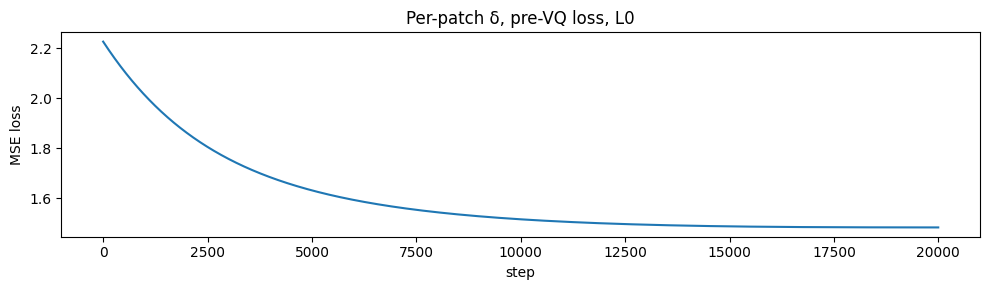

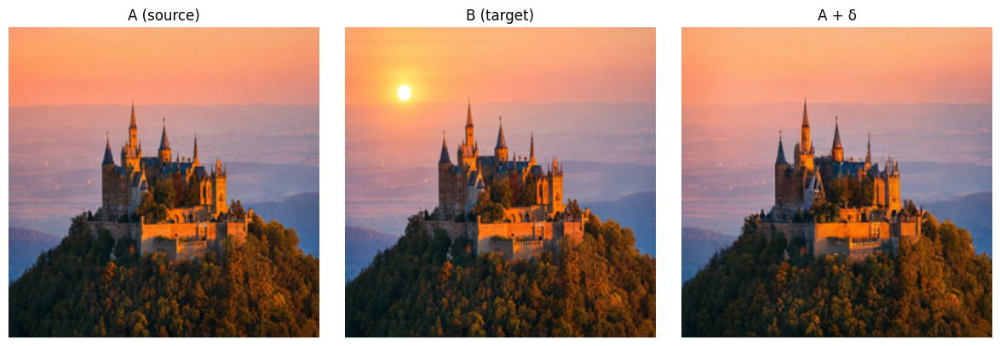

In [30]:
delta_pw, src_latent, loss_curve = find_delta_patchwise_prevq(
    tensor_a, tensor_b, lr=100.0, n_steps=50000
)

plt.figure(figsize=(10, 3))
plt.plot(loss_curve)
plt.xlabel("step"); plt.ylabel("MSE loss")
plt.title("Per-patch δ, pre-VQ loss, L0")
plt.tight_layout(); plt.show()
result = delta_patchwise_forward(tensor_a, delta_pw)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

In [42]:
def pw_L1_projection(delta, eps):
    flat = delta.view(-1)
    abs_d = flat.abs()
    if abs_d.sum() <= eps:
        return delta
    sorted_d, _ = abs_d.sort(descending=True)
    cumsum = sorted_d.cumsum(0)
    n = torch.arange(1, len(sorted_d) + 1, device=delta.device, dtype=delta.dtype)
    rho = ((sorted_d * n) > (cumsum - eps)).nonzero()[-1].item()
    theta = (cumsum[rho] - eps) / (rho + 1)
    return (flat.sign() * (abs_d - theta).clamp(min=0)).view(delta.shape)

def find_delta_patchwise_prevq_L1(tensor_a, tensor_b, lr=50.0, n_steps=10000, eps=1000.0, verbose=True):
    with torch.no_grad():
        tgt_tokens = unitok.quant_proj(unitok.encoder(tensor_b).float()).detach()

    act_buffer = []
    def _collect(m, i, o): act_buffer.append(o.detach().float())
    handle = unitok.encoder.blocks[15].register_forward_hook(_collect)
    try:
        with torch.no_grad():
            unitok.encoder(tensor_a)
            src_acts = act_buffer[0]
    finally:
        handle.remove()

    B, L, D = src_acts.shape
    with torch.no_grad():
        src_latent, _, _, _ = sae.encode(src_acts.reshape(B * L, D))
        src_latent = src_latent.detach()

    delta = torch.zeros(L, sae.hidden_dim, device=device, requires_grad=True)  # (64, 8192)
    optimizer = torch.optim.SGD([delta], lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_steps, eta_min=lr * 0.01)
    loss_steps = []
    lr_steps = []

    for step in range(n_steps):
        optimizer.zero_grad()

        def _hook(module, inp, out):
            Bh, Lh, Dh = out.shape
            return sae.decode(src_latent + delta).reshape(Bh, Lh, Dh).to(out.dtype)

        handle = unitok.encoder.blocks[15].register_forward_hook(_hook)
        try:
            src_tokens = unitok.quant_proj(unitok.encoder(tensor_a).float())
        finally:
            handle.remove()

        loss = F.mse_loss(src_tokens, tgt_tokens)
        loss.backward()
        optimizer.step()
        scheduler.step()

        with torch.no_grad():
            delta.data = pw_L1_projection(delta.data, eps)   

        loss_steps.append(loss.item())
        if verbose and step % 500 == 0:
            nnz = (delta.abs().max(dim=0).values > 1e-6).sum().item()
            print(f"  step {step:4d}  loss={loss.item():.4f}  "
                  f"lr={optimizer.param_groups[0]['lr']:.5f}  "
                  f"nnz={nnz}")

    return delta.detach(), src_latent, loss_steps

  step    0  loss=2.2265  lr=50.00000  nnz=8192
  step  500  loss=2.1711  lr=49.92340  nnz=1049
  step 1000  loss=2.1630  lr=49.69468  nnz=388
  step 1500  loss=2.1588  lr=49.31525  nnz=246
  step 2000  loss=2.1562  lr=48.78745  nnz=178
  step 2500  loss=2.1545  lr=48.11453  nnz=151
  step 3000  loss=2.1533  lr=47.30065  nnz=129
  step 3500  loss=2.1524  lr=46.35081  nnz=122
  step 4000  loss=2.1517  lr=45.27089  nnz=113
  step 4500  loss=2.1511  lr=44.06752  nnz=105
  step 5000  loss=2.1507  lr=42.74814  nnz=99
  step 5500  loss=2.1503  lr=41.32088  nnz=91
  step 6000  loss=2.1500  lr=39.79454  nnz=87
  step 6500  loss=2.1498  lr=38.17852  nnz=86
  step 7000  loss=2.1495  lr=36.48280  nnz=86
  step 7500  loss=2.1494  lr=34.71782  nnz=85
  step 8000  loss=2.1492  lr=32.89447  nnz=84
  step 8500  loss=2.1491  lr=31.02399  nnz=83
  step 9000  loss=2.1490  lr=29.11791  nnz=81
  step 9500  loss=2.1489  lr=27.18799  nnz=81
  step 10000  loss=2.1488  lr=25.24611  nnz=81
  step 10500  loss=2.

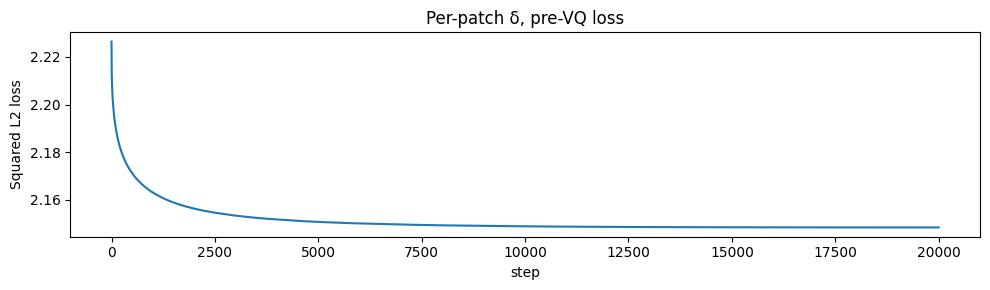

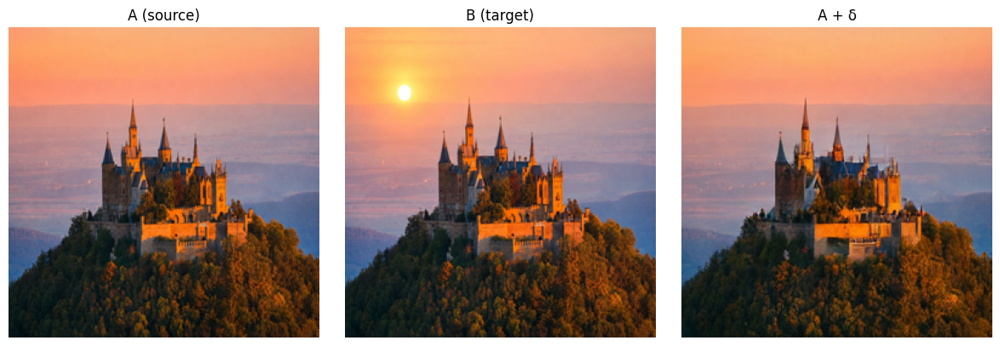

Non-zero features: 73


In [44]:
delta_pw, src_latent, loss_steps = find_delta_patchwise_prevq_L1(
    tensor_a, tensor_b, lr=50.0, n_steps=20000, eps=1000.0
)

plt.figure(figsize=(10, 3))
plt.plot(loss_steps)
plt.xlabel("step"); plt.ylabel("Squared L2 loss")
plt.title("Per-patch δ, pre-VQ loss")
plt.tight_layout(); plt.show()

result = delta_patchwise_forward(tensor_a, delta_pw)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_a.resize((256, 256))); axes[0].set_title("A (source)")
axes[1].imshow(pil_b.resize((256, 256))); axes[1].set_title("B (target)")
axes[2].imshow(to_np(result[0]));         axes[2].set_title("A + δ")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

importance_max  = delta_pw.abs().max(dim=0).values   # (8192,)
importance_mean = delta_pw.abs().mean(dim=0)          # (8192,)
nnz = (importance_max > 1e-6).sum().item()
print(f"Non-zero features: {nnz}")